# 프로젝트 : CIFAR-10 이미지 생성하기
==========================================================================================

## 목차
>### 1. 데이터 불러오기
>### 2. 생성자 모델 구현하기
>### 3. 판별자 모델 구현하기
>### 4. 훈련과정 구현하기
>### 5. 학습 진행하기
>### 6. 학습 개선하기
>### 7. 회고
>### 8. Reference
>### 9. 자기다짐 및 아쉬운 점

---
## 루브릭 달성 조건
1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.
   - 오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.
2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.
   - gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.
3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.
   - 모델구조 변경 혹은 학습과정 개선 아이디어를 추가적으로 적용해보았고, 적용 전과 비교하였을 때의 내용을 표와 같은 시각적 자료로 작성하였다.

---
## 1. 데이터 불러오기

In [1]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

tf.random.set_seed(42)

- 필요한 라이브러리들을 import 하고 seed를 42로 고정해주었습니다.

In [2]:
cifar10 = tf.keras.datasets.cifar10

# (x_train, _), (x_test, _) = cifar10.load_data()
(x_train, _), (_, _) = cifar10.load_data()

x_train.shape

(50000, 32, 32, 3)

- 다른 데이터들은 필요가 없기에 x_train 만 가져왔습니다.
- (50000, 32, 32, 3) 의 32x32x3 크기의 이미지 5만장이 로드된것을 확인할 수 있습니다.

In [5]:
x_train = (x_train - 127.5) / 127.5

print("max pixel:", x_train.max())
print("min pixel:", x_train.min())

max pixel: 1.0
min pixel: -1.0


- 각 픽셀을 -1부터 1값으로 정규화 해주었습니다.

In [6]:
x_train = x_train.reshape(x_train.shape[0], 32, 32, 3).astype('float32')
x_train.shape

(50000, 32, 32, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


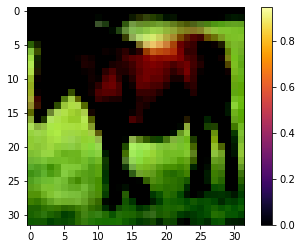

In [7]:
plt.imshow(x_train[7].reshape(32, 32, 3), cmap='inferno')
plt.colorbar()
plt.show()

- 사진을 출력해보니 경고메시지가 뜨지만 사진은 잘 로드가 되는것을 확인할 수 있습니다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

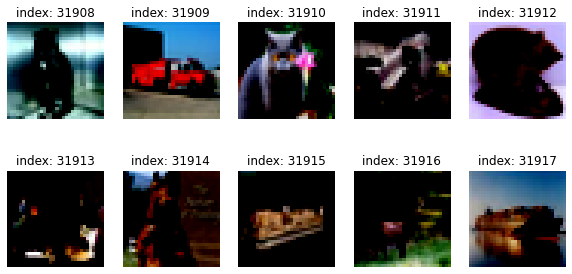

In [8]:
plt.figure(figsize=(10, 5))
num = np.random.randint(1, 50000)

for i in range(num,num+10):
    plt.subplot(2, 5, i-num+1)
    plt.imshow(x_train[i].reshape(32, 32, 3))
    plt.title(f'index: {i}')
    plt.axis('off')
plt.show()

- 랜덤한 10개의 사진을 가져왔습니다. 조금 어둡긴 하지만 각각 무엇을 뜻하는 사진인지 어느정도 알 수 있습니다.
  
  
- 각각의 클래스는 아래와 같습니다.

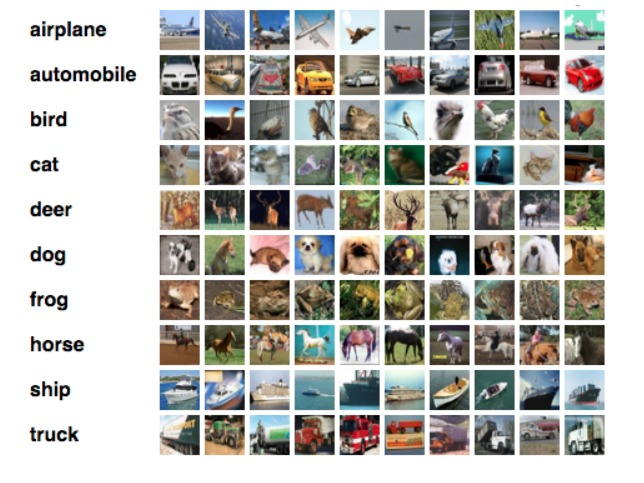

In [9]:
BUFFER_SIZE = 50000
BATCH_SIZE = 16

In [10]:
train_dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

- buffer_size를 정하여 셔플하고 batch_size를 지정하여 주었습니다.

- __from_tensor_slices 란?__ 

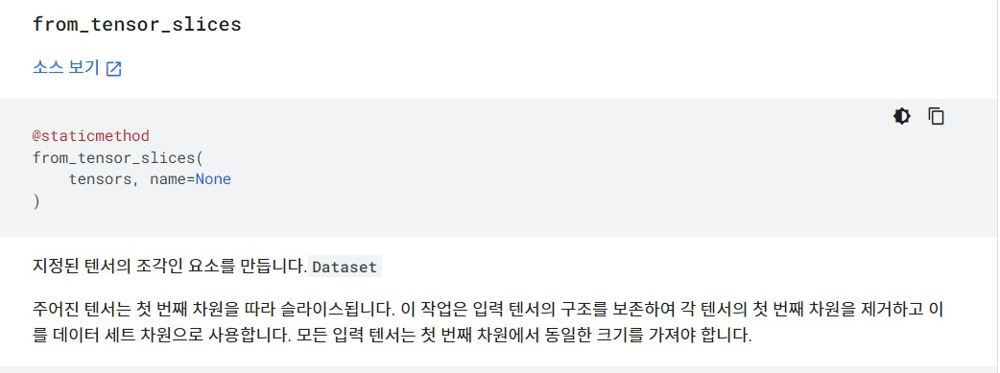

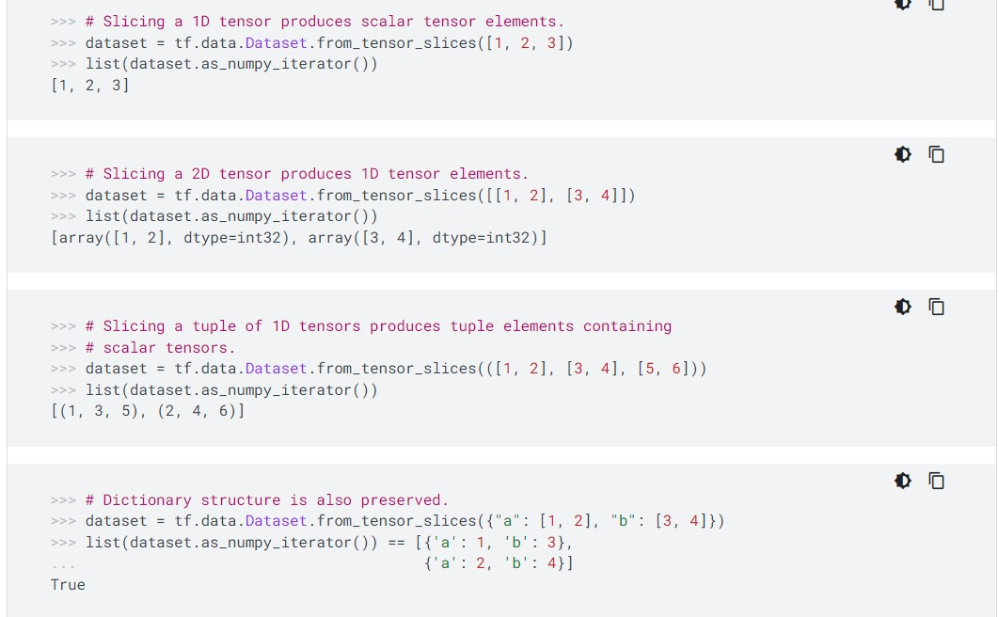
  
  
- tensor 형태의 데이터를 말 그대로 슬라이스해주는 함수였군요. 
  
  
- 이해만 한다면 상당히 유용하게 쓸 수 있는 함수인것 같습니다.

---
## 2. 생성자 모델 구현하기


In [11]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*128, use_bias=False, activation='gelu', input_shape=(100,)))
    model.add(layers.BatchNormalization())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 128)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(120, kernel_size=(5, 5), strides=(2, 2), padding='same', activation='gelu', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))    

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(60, kernel_size=(5, 5), strides=(2, 2), padding='same', activation='gelu', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))    

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='tanh', use_bias=False))

    return model

In [12]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              819200    
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 120)       384000    
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 120)       480       
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 120)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 60)        1

- 약 140만개의 파라미터를 가진 생성자 신경망이 생성되었습니다.
  
  
- 입력층은 Dense층으로 8x8x128개의 파라미터를 갖도록 설계하고 정규화해주었습니다.
- 다음으로 reshape layer를 이용하여 이미지를 8x8x128 의 형태를 갖도록 하였습니다.
- 그 뒤로 conv2d_transpose layer에선 activation 함수로 gelu를 사용하였습니다.
   - 본문에선 leakyrelu 를 사용하고 다른 참고문헌에서는 relu를 사용하라고 했으나 저는 이 데이터가 -1 ~ 1 사이의 값으로 구성된 데이터인데 relu를 쓰면 안되지 않을까? 생각하게 되었습니다. 그리하여 leakyrelu, prelu, elu 등 써보았으나 gelu가 가장 성능이 좋아 채용하게 되었습니다.
   
- 마지막으로 출력층인 Dense층의 units은 3으로 3채널 이미지를 표현하기 위해 설정하였고 -1 ~ 1 사이의 값으로 구성되어 있으니 tanh 를 사용하였습니다.

In [13]:
noise = tf.random.normal([1, 100])

In [14]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

- noise 이미지를 만들어 적용해보았더니 적합한 사이즈의 이미지인것이 확인됩니다.

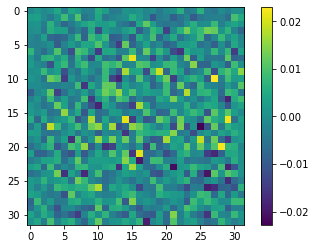

In [15]:
plt.imshow(generated_image[0,:,:, 0])
plt.colorbar()
plt.show()

- 출력도 잘 되는군요!

---
## 3. 판별자 모델 설계

In [16]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(60, (5, 5), strides=(2, 2), padding='same', activation='LeakyReLU', input_shape=[32, 32, 3]))
    model.add(layers.Dropout(0.5))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(120, (5, 5), strides=(2, 2), padding='same', activation='LeakyReLU'))
    model.add(layers.Dropout(0.5))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

In [17]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 60)        4560      
_________________________________________________________________
dropout_2 (Dropout)          (None, 16, 16, 60)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 120)         180120    
_________________________________________________________________
dropout_3 (Dropout)          (None, 8, 8, 120)         0         
_________________________________________________________________
flatten (Flatten)            (None, 7680)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 7681      
Total params: 192,361
Trainable params: 192,361
Non-trainable params: 0
________________________________________________

- 약 19만개의 파라미터를 가진 판별자 모델을 생성하였습니다.
- 생성자 모델의 역순으로 진행하였으며 특징으로는 마지막 출력층인 Dense층의 units이 1, 그리고 activation이 'sigmoid' 인것이 특징입니다.
- 판별자가 판단해야하는것은 진짜, 가짜 두개의 이진 분류이므로 0 ~ 1 의 값을 판단하는 sigmoid 함수가 가장 적합하다고 판단하여 채용하였습니다.

In [18]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.49938706]], dtype=float32)>

- 생성자 모델이 만든 이미지가 판별자 모델이 판단하기에 적절한 이미지 크기라는것을 확인할 수 있습니다.

In [19]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [20]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [21]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

- 각각 생성자, 판별자의 loss와 accuracy 함수를 생성하였습니다.

#### 각 함수들에 대한 설명
- 1. tf.math.greater_equal(real_output, tf.constant([0.5]) : real_output의 각 원소가 0.5 이상인지 True, False로 판별
    - 0.5 이상이면 True, 0.5 미만이면 False
- 2. tf.cast() : 1 의 결과가 True이면 1.0, False이면 0.0으로 변환
- 3. tf.reduce_mean() 2 의 결과를 평균내어 이번 배치의 정확도(accuracy)를 계산

In [22]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

In [23]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

- optimizer로는 Adam을 사용하였고 SGD, amsgrad 등 사용해봤으나 역시나 Adam이 가장 적합한것을 확인하여 채용하였습니다.
- loss로는 진짜, 가짜를 판단하는 이진 분류이기에 BinaryCrossentropy를 사용하였습니다.

---
## 4. 훈련과정 구현하기

In [24]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

In [25]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

- train_step 함수를 생성하였습니다. 각각 step별 역할은 아래와 같습니다.
  
  
- (1) 입력 데이터: Real Image 역할을 할 images 한 세트를 입력으로 받음
- (2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함
- (3) tf.GradientTape()는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 with 구문 열기
- (4) generated_images 생성 : generator가 noise를 입력받은 후 generated_images 생성
- (5) discriminator 판별 : discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력
- (6) loss 계산 : fake_output, real_output으로 generator와 discriminator 각각의 loss 계산
- (7) accuracy 계산 : fake_output, real_output으로 discriminator의 정확도 계산
- (8) gradient 계산 : gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산
- (9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신
- (10) 리턴값 : 이번 스텝에 계산된 loss와 accuracy를 리턴

In [26]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        img = np.array((predictions[i] * 127.5) + 127.5).astype('uint8')
        plt.imshow(img)
        plt.axis('off')
   
    plt.savefig('{}/aiffel/exp/11_gan/images/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

- 생성한 이미지를 실시간으로 출력해주는 함수를 생성하였습니다.
- 8,8 사이즈의 크기로 16개의 이미지를 보여주도록 만들었습니다.
- 또한 현재 데이터가 -1,1 의 크기이기에 정규화를 풀고 출력할 수 있도록 설정하였습니다.
- 생성된 이미지는 특정 폴더에 저장됩니다.

In [27]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/exp/11_gan/images/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

- history 진행상황을 그래프로 보여주는 함수입니다.
- accuracy, loss의 현재 상황을 보여줍니다.

In [28]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/exp/11_gan/images/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

- 혹여나 이어서 진행할 수 있도록 체크포인트를 설정해주었습니다.

In [29]:
anim_file = os.getenv('HOME')+'/aiffel/exp/11_gan/images/fin_gif/fashion_mnist_dcgan.gif'

def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)    
            with imageio.get_writer(anim_file, mode='I') as writer:
                filenames = glob.glob('{}/aiffel/exp/11_gan/images/generated_samples/sample*.png'.format(os.getenv('HOME')))
                filenames = sorted(filenames)
                last = -1
                for i, filename in enumerate(filenames):
                    frame = 2*(i**0.5)
                    if round(frame) > round(last):
                        last = frame
                    else:
                        continue
                    image = imageio.imread(filename)
                    writer.append_data(image)
                image = imageio.imread(filename)
                writer.append_data(image)    
        
        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

- 훈련 함수입니다.
- 아까 설정해놓았던 train_step 함수를 비롯하여 생성해놓은 함수들을 이용하여 50 iter 마다 사진을 저장하도록 하였고 20 epochs마다 gif를 최신화하도록 설정하였습니다.
- 또한 20 epochs마다 history 그래프를 출력하도록 하였습니다.
- 한번 훈련을 해보도록 하겠습니다.

## 5. 학습 진행하기

In [30]:
save_every = 20
EPOCHS = 100

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

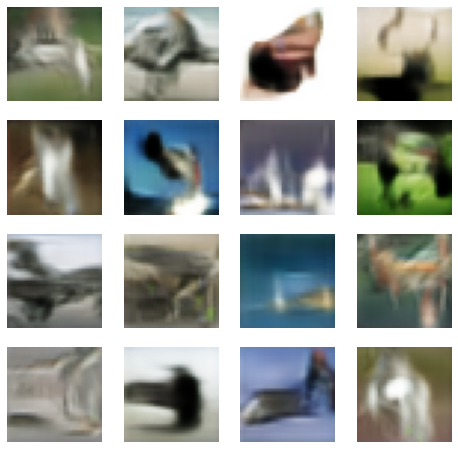

Time for training : 9087 sec


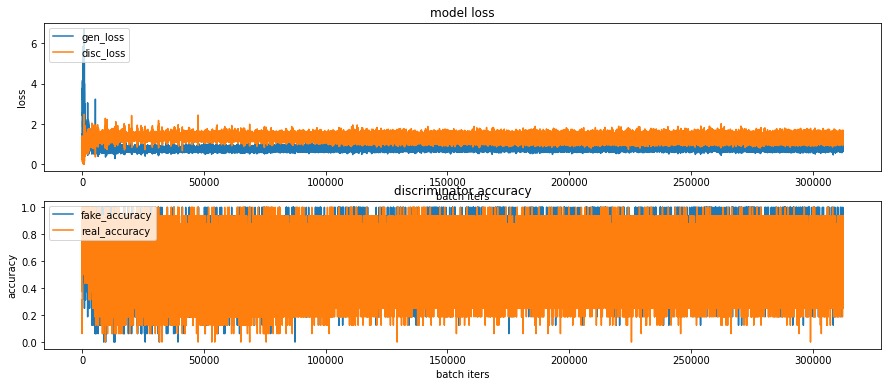

CPU times: user 2h 45min 23s, sys: 19min 33s, total: 3h 4min 57s
Wall time: 2h 31min 44s


In [31]:
%%time
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/fashion/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인해 보시길 권합니다.

- 사실 이 모델이 최종 개선 모델입니다.

- 위 모델의 GIF
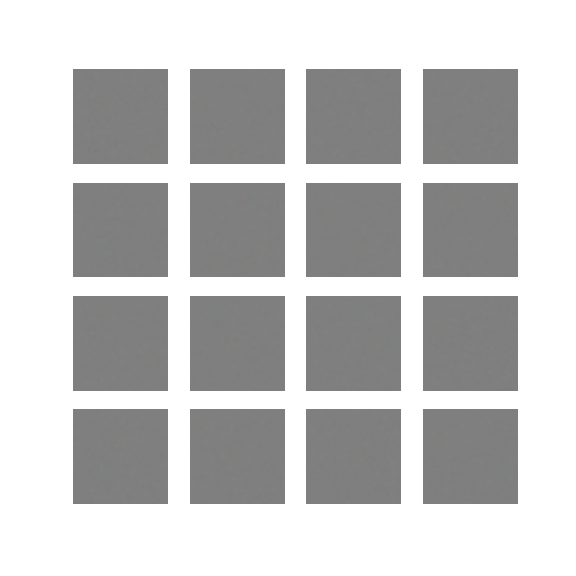

- (1,1) 은 배 (1,4) 는 개구리 같은 모습을 보여주는듯.. 합니다만 무언가 애매합니다. 확실하게 분간하기엔 어려움이 있는듯 합니다.

## 6. 학습 개선하기 전의 모습

- 생성자의 activation function으로 relu를 사용하여 epochs 를 100번 돌린 모델의 모습입니다.

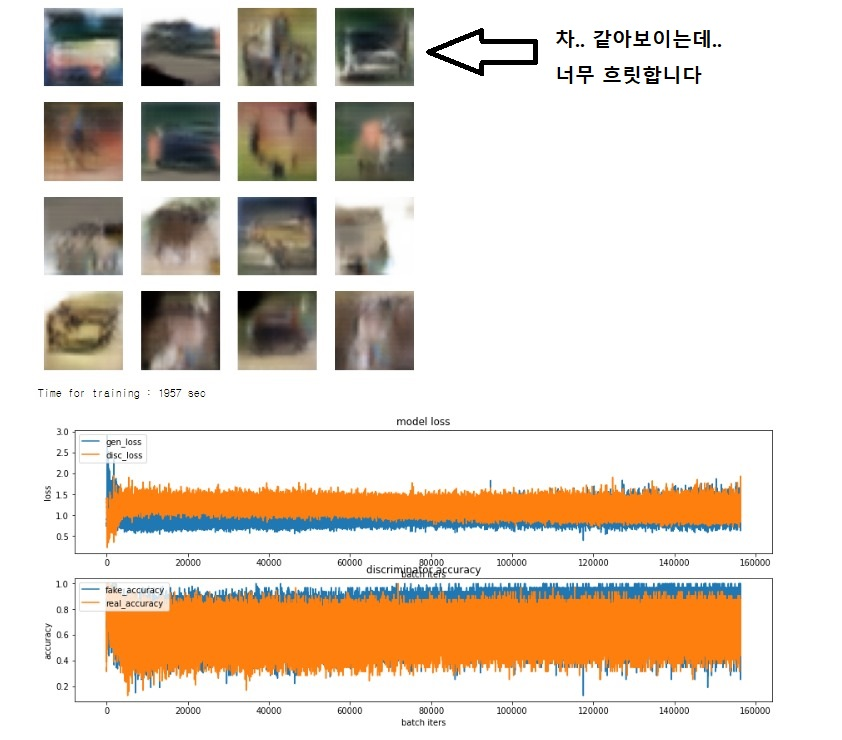

- 위 모델이 첫 모델입니다만 형태를 알아보기 힘들정도로 흐릿합니다.
- 마지막 모델과의 차이점이라면 판별자의 Dense층의 units를 3으로 지정해 주었습니다.
- 이 땐 생각을 못했습니다만 생각해보니 sigmoid 함수를 적용하여 이진분류해주는 문제인데.. 생각도 안하고 units을 3으로 지정해주고 있었더라구요.. 그러한 차이가 있었습니다.

- 위 모델과 동일하나 epochs를 562번 학습한 모델입니다.

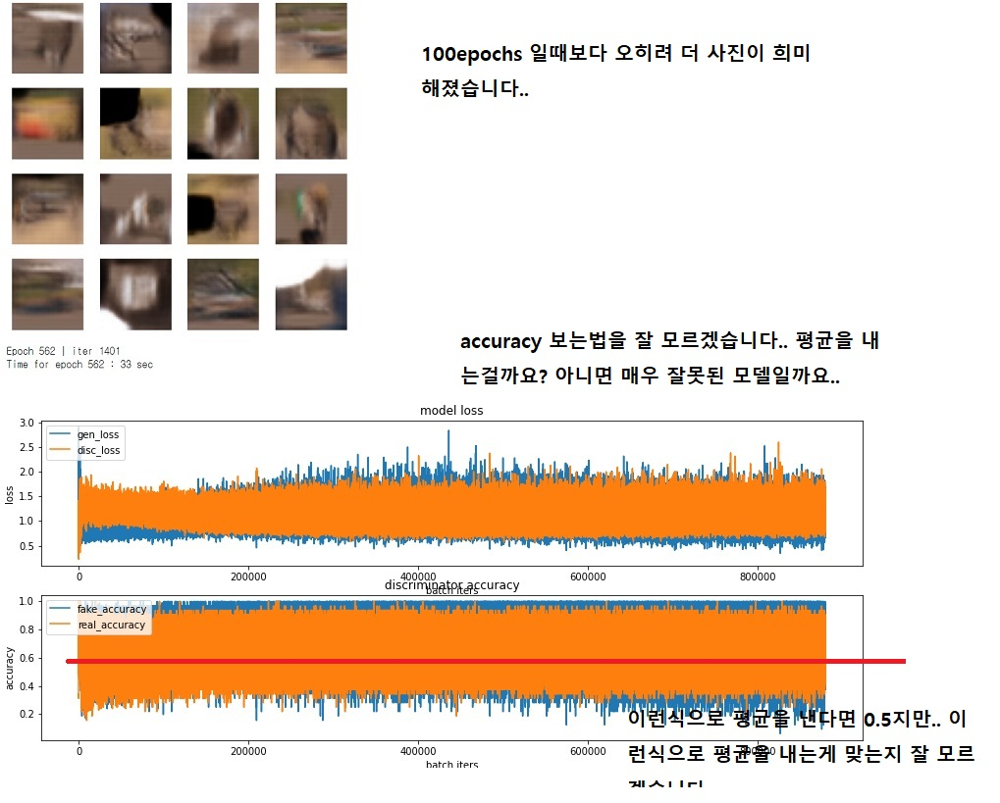

- 다음으론 activation 함수를 gelu로 적용하여 epochs 를 250번 학습한 모습입니다.

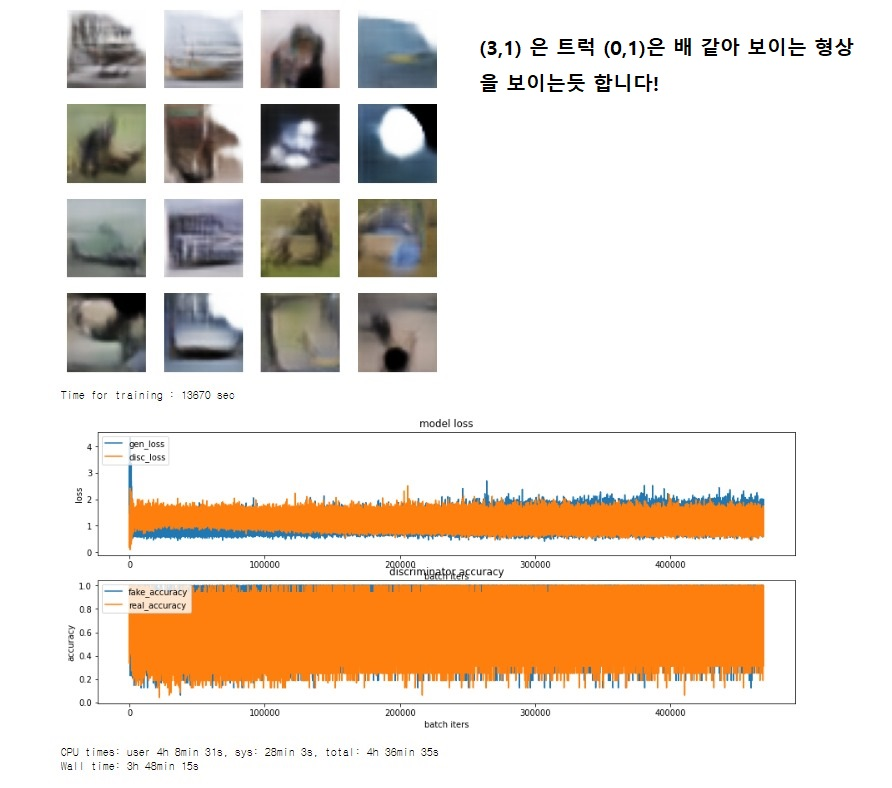
  
  
- 역시 accuracy 그래프는 동일하나.. 그래도 확실하게 사진은 향상된 모습을 보여주고 있습니다. gelu가 효과가 있군요!

---
>- GIF를 첨부하고 싶었으나 용량이 너무 커져 github에 업로드되지 않는 현상이 발생하게되어 부득이하게 삭제하게 되었습니다.
---

---
## 7. 회고

### 이번 프로젝트를 하면서 어려웠던 점
>- 이번 프로젝트는 너무 어려웠습니다.. 이것저것 다양한 시도를 해보기에도 물리적인 시간이 부족했고 특히나 conv2d layer 들이 가장 어려웠습니다. 제가 아직도 제대로 이해하지 못한 부분이라 cv가 아닌 nlp를 선택하게 된것도 있는데 여기서 많이 사용하게되니 각각이 어떤 의미를 갖고 어떤 효과를 주는지 파악하는데 어려웠습니다.

### 이번 프로젝트에서 학습한 내용
>- 이번 프로젝트에서는 그래도 conv2d layer와 conv2d transpose layer에 관하여 좀 알아보았고 특히 모르는 함수들이 많이나와 함수들에 대하여도 공부하였습니다. 또한 gan에 관하여 학습하였고 gan에 적합한 activation function, layer, 학습방법 등에 관하여 학습하게 되었습니다.

### 알아낸 점이나 모호한 점
>- 위에서 말씀드린 공부한 내용들을 아직 정확하게 파악하지는 못합니다. 하지만 점점 activation function에 관하여 파악하게 되고있고 점점 지식이 깊어지는것이 느껴집니다만 역시나 이미지나 CV관련한 좌표, 수식 같은 부분에선 많이 약한것이 느껴집니다.

### 루브릭 평가지표를 맞추기 위해 노력했던 점
>- __1. 오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.__ 에 관하여서는 위에서 말씀드렸듯이 다양한 activation function, 다양한 units들에 관하여 시도해보았고 눈에 띌만큼의 성능을 보여주었습니다. 하지만 향상된 성능마저도 육안으로 구별할 수 있는가? 에 관하여서는 정확하게 말씀드리기 어려운것 같습니다. 보고자하면 보이지만 보고자하지 않으면 안보입니다..
>- __2. gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.__ 에 관하여서는 품질이 서서히 향상되는 모습은 보여주고있습니다. 하지만 accuracy가 추세적으로 하향하는모습은 보여주지 못하고있고 시작부터 끝까지 평균을 낸다면 0.5에 근접하는 모습은 보여주고 있습니다.
>- __3. 모델구조 변경 혹은 학습과정 개선 아이디어를 추가적으로 적용해보았고, 적용 전과 비교하였을 때의 내용을 표와 같은 시각적 자료로 작성하였다.__ 에 관하여서는 많은 시도를 해보았고 그 중 성공적으로 변화 성과를 보인 모델을 위에 게시하였습니다. activaiton function, dropout, batchnormalization 등등 많은 시도를 해보았습니다. 표로는 표현하지 못했지만 시각적 자료인 사진을 이용하여 최대한 표현해 보도록 노력하였습니다. 

### 루브릭 평가지표를 달성하지 못했다면 이유
>- 아무래도 이번 프로젝트는 매우 어려웠고 1번부터 3번까지 모두 애매한 성능을 보여주었습니다. 많은 시도를 통해 개선해보고 싶었지만 한번 모델 학습에 짧아도 4~5시간 길면 12시간이 넘는 모습을 보여주어 물리적인 시간 부족으로 인해 다양한 시도를 못해보았기에 루브릭에 대해 많은 도전을 해보지 못했습니다.

---
## 8. Reference

- https://blog.naver.com/esmeehudson/222694689877 판별기에 sigmoid를 쓰는 이유
- https://paperswithcode.com/paper/on-the-convergence-of-adam-and-beyond-1 amsgrad 관련
- https://www.tensorflow.org/api_docs/python/tf/data/Dataset#from_tensor_slices from_tensor_slices 공식 문서
- https://github.com/soumith/ganhacks GAN 어떻게 써야하는가?

---
## 9. 자기다짐 및 아쉬운 점

- 이번 프로젝트는 상당히 어려웠습니다. 이해하기도 힘들고 무언가 적용해보기도 어려웠으며 각 함수들에 대한 이해도가 많이 떨어져 GAN 자체에 대한 이해도가 모자란게 좀 아쉽습니다.
  
  
- 가장 아쉬운 점으로는 많은 시도를 못해봤다는것이고 학습때 물리적인 시간이 너무 많이 걸리기에 다양하게 적용해보지 못해 좋은 성능을 이끌어내지 못한점이 아쉽습니다. 시간이 조금만 더 있었다면 더 좋은 성능을 이끌어 낼 수 있었을것 같은 생각이 듭니다.
  
  
- 앞으로 GAN을 얼마나 더 사용하게 될진 모르지만 분야가 이미지 뿐만아니라 텍스트 분야에도 적용되는것을 보게 되었습니다. 때문에 앞으로도 많이 알아둬야할 분야가 아닌가 생각이 듭니다.